<h1>War Damage Detection Pipeline v3 — shared</h1>

This is the <b>post-export</b> version. The Sentinel-1 rasters, the PlanetScope
composites and the extracted patch arrays are already on Drive. No Planet API key,
no Earth Engine project and no imagery download are required to run this notebook.

<h3>What to share with colleagues</h3>

Right-click the <code>War_Damage</code> folder in Drive → Share → add email
addresses with at least <b>Viewer</b> access (Editor if they will write checkpoints).

<b>Subfolders they need:</b>
<ul>
<li><code>War_Damage/rasters/</code> — S1 and Planet GeoTIFFs</li>
<li><code>War_Damage/datasets/</code> — extracted patch arrays (.npz + .parquet, the cache)</li>
<li><code>War_Damage/one_month/</code> — UNOSAT label CSVs</li>
<li><code>War_Damage/experiments/</code> — checkpoints and metrics (only needed to skip retraining)</li>
</ul>

<b>The cache is the key thing.</b> As long as <code>datasets/</code> is shared,
<code>get_city()</code> reads the pre-extracted arrays in seconds and never touches
the rasters or Planet. If a colleague adds a new city, they will also need
<code>rasters/</code> and a Planet key — that is the only case where the full
pipeline is required.

<h2>1. Setup and configuration</h2>

The single source of truth for an experiment. The config is validated, then saved to the
experiment output folder so every run is reproducible. Outputs are organized as
<code>experiments/{experiment_name}/</code> with subfolders for models, metrics,
figures and predictions.

In [ ]:
import os
import json
import copy
import hashlib
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from rasterio.features import rasterize
from shapely.geometry import shape
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import (precision_recall_fscore_support, average_precision_score,
                             roc_auc_score, precision_recall_curve)

CONFIG = {
    "experiment_name": "exp004_siamese_unet_planet",
    "seed": 0,

    # "classification" predicts one label per building patch
    # "segmentation" is a placeholder for per pixel damage maps, see Section 7
    "task": "classification",

    # PWTT ships two geometries per city and date. footprints anchors patches on
    # buildings, grid anchors them on regular cells.
    "label_geometry": "footprints",

    # Feature switches. The pipeline builds the widest stack available per city
    # and these select which channels and tables the model actually sees.
    #
    # planet is PlanetScope Ortho Scene surface reflectance at 3 m, four bands.
    # There is deliberately no planet SAR switch: Planet flies optical CubeSats
    # only, so SAR is Sentinel 1 whether or not the Planet grant is active.
    #
    # footprint_mask rasterises the target building into its own channel. It is
    # the only channel that is identical between pre and post, which is what
    # lets the Siamese encoder use it as a pointer rather than as evidence.
    "features": {
        "sentinel1": True,
        "sentinel2": False,
        "planet": True,
        "footprint_mask": True,
        "pwtt_tabular": False,
        "pre_event": True,
        "post_event": True,
    },

    # Imagery export settings, baked into the raster filename so changing them
    # forces a new export instead of silently reusing the old one.
    "imagery": {
        "gee_project": "satelite-data-504215",
        "pre_months": 12,              # pre war baseline length
        "post_months": 1,              # post window length, matches one_month
        "post_direction": "forward",   # forward is PWTT convention
        "scale": 10,                   # metres per pixel for the Sentinel grid
        "aoi_buffer_deg": 0.005,
        "s2_max_cloud": 60,
        "min_aoi_coverage": 0.90,
    },

    # PlanetScope settings. 3 m is the Ortho Scene grid; the native GSD is about
    # 3.7 m, so 3 m is already a mild upsample and going below it buys nothing.
    #
    # The whole stack is resampled onto one grid at planet_scale, so a patch of
    # patch_size pixels covers patch_size * 3 metres. At 32 px that is 96 m,
    # roughly the 500 m PWTT cell divided by five.
    "planet": {
        "item_type": "PSScene",
        "asset": "ortho_analytic_4b_sr",   # surface reflectance, falls back to TOA
        "bundle": "analytic_sr_udm2",
        "bands": ["B", "G", "R", "NIR"],   # PlanetScope band order
        "scale": 3,                        # metres per pixel, Ortho Scene grid
        "max_cloud": 0.25,                 # scene level cloud_cover filter
        "window_days": 30,                 # search window either side of a date
    },

    # One of the keys in MODEL_REGISTRY (Section 7): small_cnn, two_branch,
    # siamese, siamese_unet, unet.
    "model": "siamese_unet",
    "model_kwargs": {"width": 8},

    # At planet_scale 3 m a 32 px patch is 96 m across, which comfortably holds
    # a building and its immediate surroundings.
    "patch_size": 32,
    "batch_size": 128,
    "learning_rate": 3e-4,
    "max_epochs": 120,
    "early_stopping_patience": 30,

    # Split entries are "City" or "City:lo-hi" for a latitude quantile band.
    "split": {
        "train": ["Gaza:0.55-1.00"],
        "val":   ["Gaza:0.33-0.55"],
        "test":  ["Gaza:0.00-0.33"],
    },

    "augmentation": {
        "geometric": True,
        "label_temporal": False,
        "spatial_smoothing": {"enabled": False, "k": 8, "weight": 0.3},
    },

    # cap on rows per city, None means use every row in the label file
    "n_sample": None,

    # Extracted patch arrays are cached to Drive under a hash of the settings
    # that change their content. Set to False to force re-extraction.
    "use_dataset_cache": True,   # always True — cache is on Drive

    "output_root": "/content/drive/MyDrive/Colab Notebooks/War_Damage/experiments",
}


def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)


def validate_config(cfg):
    """Fail early with a readable message instead of a confusing crash later."""
    f = cfg["features"]
    if not (f["sentinel1"] or f["sentinel2"] or f["planet"]):
        raise ValueError("enable at least one imaging feature")
    if not (f["pre_event"] or f["post_event"]):
        raise ValueError("enable at least one of pre_event or post_event")
    if cfg["model"] == "two_branch" and not (f["sentinel1"] and f["sentinel2"]):
        raise ValueError("two_branch needs both sentinel1 and sentinel2 enabled")
    if cfg["model"] in ("siamese", "siamese_unet") and not (f["pre_event"] and f["post_event"]):
        raise ValueError("siamese compares pre and post, enable both")
    if cfg["model"] == "siamese_unet" and not f["footprint_mask"]:
        raise ValueError("siamese_unet pools over the footprint mask, enable it")
    if cfg["task"] == "segmentation" and cfg["model"] != "unet":
        raise ValueError("segmentation currently expects the unet model")
    if cfg["label_geometry"] not in ("footprints", "grid"):
        raise ValueError("label_geometry must be footprints or grid")
    if cfg["imagery"]["post_direction"] not in ("forward", "backward"):
        raise ValueError("post_direction must be forward or backward")
    if f["planet"] and f["footprint_mask"] and cfg["label_geometry"] == "grid":
        print("NOTE: footprint_mask over grid cells rasterises the cell, not a "
              "building. Masked pooling then averages the whole cell.")


def make_output_dirs(cfg):
    root = os.path.join(cfg["output_root"], cfg["experiment_name"])
    dirs = {name: os.path.join(root, name)
            for name in ["models", "metrics", "figures", "predictions"]}
    for d in dirs.values():
        os.makedirs(d, exist_ok=True)
    with open(os.path.join(root, "config.json"), "w") as fh:
        json.dump(cfg, fh, indent=2)
    return root, dirs


# The grid every sensor is resampled onto. Planet at 3 m is the finest source,
# so it sets the grid whenever it is enabled and Sentinel is upsampled to match.
def working_scale(cfg=None):
    cfg = cfg or CONFIG
    return cfg["planet"]["scale"] if cfg["features"]["planet"] else cfg["imagery"]["scale"]


validate_config(CONFIG)
set_seed(CONFIG["seed"])
device = "cuda" if torch.cuda.is_available() else "cpu"
EXP_ROOT, OUT = make_output_dirs(CONFIG)
print(f"experiment folder: {EXP_ROOT}")
print(f"device: {device}")
print(f"working grid: {working_scale()} m/px, patch {CONFIG['patch_size']} px "
      f"= {CONFIG['patch_size'] * working_scale()} m")


<h2>2. Data registry and label loading</h2>

One registry entry per city holding what is needed to find its labels and export its
imagery. Adding a city means adding a dictionary here or calling <code>add_city</code>,
and nothing else in the notebook changes.

Registry entries deliberately do not contain raster paths. Paths are derived from the
city, the assessment date and the imagery settings, so two experiments with different
window lengths cannot accidentally share a raster.

In [ ]:
# Defines cities and dates. get_city() uses this to find the
# cached .npz on Drive. No export is triggered.

# label_dates lists the UNOSAT assessment dates available for the city, oldest
# first. Several dates per city is what powers temporal label augmentation.
# war_start is the conflict start used for the pre war baseline window.
CITY_REGISTRY = {
    "Gaza":   {"label_dates": ["20240503"], "war_start": "2023-10-07"},
    "Raqqa":  {"label_dates": ["20171021"], "war_start": "2017-06-06"},
    "Aleppo": {"label_dates": ["20160918"], "war_start": "2016-07-01"},
    "Irpin":  {"label_dates": ["20220331"], "war_start": "2022-02-24"},
    "Bucha":  {"label_dates": ["20220331"], "war_start": "2022-02-24"},
}

# Everything persistent lives under DRIVE_ROOT so a fresh runtime re-reads
# instead of re-downloading. Planet quota makes this non-negotiable.
DRIVE_ROOT   = "/content/drive/MyDrive/Colab Notebooks/War_Damage"
DATA_DIR     = f"{DRIVE_ROOT}/one_month"
RASTER_DIR   = f"{DRIVE_ROOT}/rasters"
DATASET_DIR  = f"{DRIVE_ROOT}/datasets"
for _d in (RASTER_DIR, DATASET_DIR):
    os.makedirs(_d, exist_ok=True)

# PWTT columns we treat as tabular features. damage_pts is banned on purpose,
# it counts the UNOSAT points that created the label, so using it is leakage.
TAB_FEATURES = ["k50", "k100", "k150", "max_change", "area"]

# Sentinel 1 IW GRD only becomes routinely available in late 2014. Aleppo in
# particular sits close to this limit, so the exporter warns rather than
# silently producing an empty pre war composite.
S1_EARLIEST = "2014-10-01"


def add_city(name, label_dates, war_start):
    """Register a new city at runtime. Imagery is exported on first use."""
    CITY_REGISTRY[name] = {"label_dates": list(label_dates), "war_start": war_start}


def label_path(city, date, cfg=None):
    """PWTT label file for one city and assessment date."""
    kind = (cfg or CONFIG)["label_geometry"]
    return os.path.join(DATA_DIR, f"{city}_{date}_1_{kind}.csv")


def load_labels(city, date, cfg=None):
    """Read one PWTT CSV into a GeoDataFrame with centroid points."""
    path = label_path(city, date, cfg)
    if not os.path.exists(path):
        raise FileNotFoundError(
            f"{path} not found. Check that the PWTT one_month folder is extracted "
            f"next to this notebook and that {city} has an assessment on {date}.")
    df = pd.read_csv(path, low_memory=False)
    geoms = [shape(json.loads(g)) for g in df[".geo"]]
    gdf = gpd.GeoDataFrame(df.drop(columns=[".geo"]), geometry=geoms, crs="EPSG:4326")
    # centroids computed in a projected system, then converted back to lon lat
    gdf["centroid"] = gdf.geometry.to_crs(3857).centroid.to_crs(4326)
    return gdf


def city_bbox(city, date, cfg=None):
    """AOI for the export, taken from the labelled geometries plus a buffer."""
    cfg = cfg or CONFIG
    gdf = load_labels(city, date, cfg)
    minx, miny, maxx, maxy = gdf.total_bounds
    b = cfg["imagery"]["aoi_buffer_deg"]
    return [minx - b, miny - b, maxx + b, maxy + b]


def raster_path(city, date, sensor, cfg=None):
    """Filename encodes the export settings so different windows never collide.

    Rasters live on Drive, not in the runtime, so a reconnect does not trigger
    a re-export — or, for Planet, a re-order that spends quota twice.
    """
    im = (cfg or CONFIG)["imagery"]
    os.makedirs(RASTER_DIR, exist_ok=True)
    tag = f"pre{im['pre_months']}m_{im['post_direction']}{im['post_months']}m"
    if sensor == "ps":
        tag += f"_{(cfg or CONFIG)['planet']['scale']}m"
    return os.path.join(RASTER_DIR, f"{city.lower()}_{date}_{sensor}_{tag}.tif")

<h2>3. Preprocessing — reads from the Drive cache</h2>

For cities that are already extracted (see <code>datasets/</code>), this section
returns cached arrays in seconds. The full extraction code is included so the
pipeline is self-contained if a new city needs to be added later — in that case
the imagery rasters and the extraction will run once, write to the cache, and
every subsequent run is fast again.

In [ ]:
# get_city() checks the Drive cache first and returns immediately
# for cities that are already extracted. The code below only runs
# if a city is not cached yet.

# Names of every channel the pipeline knows about, in export order per sensor.
S1_CHANNELS = ["s1_pre_VV", "s1_pre_VH", "s1_post_VV", "s1_post_VH"]
S2_CHANNELS = ["s2_pre_B2", "s2_pre_B3", "s2_pre_B4", "s2_pre_B8",
               "s2_post_B2", "s2_post_B3", "s2_post_B4", "s2_post_B8"]
PS_CHANNELS = ["ps_pre_B", "ps_pre_G", "ps_pre_R", "ps_pre_NIR",
               "ps_post_B", "ps_post_G", "ps_post_R", "ps_post_NIR"]
# Two footprint channels, neither pre nor post: identical in both periods, which
# is exactly what makes them usable as a pointer rather than as evidence.
#   fp_target  the one building this row is labelled about
#   fp_context every other footprint in the patch
# They must stay separate. Pooling over a single all-buildings mask would average
# the logits of the target and its neighbours, so a row's prediction would depend
# on buildings that carry their own labels.
FP_CHANNELS = ["fp_target", "fp_context"]
FULL_CHANNELS = S1_CHANNELS + S2_CHANNELS + PS_CHANNELS + FP_CHANNELS


def read_raster(path):
    """Read a whole raster, cleaned, with everything needed to georeference it.

    Sentinel 1 writes out of swath pixels as -inf, the log of zero. Left in,
    bilinear resampling onto a finer grid smears each one across its whole
    interpolation kernel, which is enough to reject every patch in a city.
    """
    with rasterio.open(path) as src:
        arr = src.read().astype(np.float32)
        meta = (~src.transform, src.height, src.width, src.crs, src.transform)
    return (np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0),) + meta


def read_raster_on_grid(path, ref):
    """Reproject one raster onto the reference raster's grid.

    Planet delivers in UTM and Earth Engine exports in EPSG:4326, so matching
    array shapes is not enough — the pixels have to be warped, or the SAR bands
    line up with the wrong ground and the difference between periods becomes
    meaningless.
    """
    from rasterio.warp import reproject, Resampling
    _, ref_inv, H, W, ref_crs, ref_tr = ref
    with rasterio.open(path) as src:
        # Clean the source array first. Warping straight from the band would let
        # GDAL turn -inf into the float32 minimum, about -3.4e38, which is
        # finite and so survives every later non-finite check while destroying
        # any normalisation computed over it.
        src_arr = np.nan_to_num(src.read().astype(np.float32),
                                nan=0.0, posinf=0.0, neginf=0.0)
        dst = np.zeros((src.count, H, W), np.float32)
        reproject(source=src_arr, destination=dst,
                  src_transform=src.transform, src_crs=src.crs,
                  dst_transform=ref_tr, dst_crs=ref_crs,
                  resampling=Resampling.bilinear,
                  src_nodata=None, dst_nodata=0.0)
    return (np.nan_to_num(dst, nan=0.0, posinf=0.0, neginf=0.0),
            ref_inv, H, W, ref_crs, ref_tr)


def footprint_id_raster(gdf_ref, ref):
    """Burn every footprint with its row number, so a patch can separate the
    target building from its neighbours without a second rasterisation pass.

    gdf_ref must already be in the reference raster's CRS. Small footprints are
    burned last (sorted by descending area) so a building smaller than a pixel
    still claims one instead of being swallowed by the warehouse next door.
    """
    _, ref_inv, H, W, ref_crs, ref_tr = ref
    geoms = gdf_ref.geometry.values
    order = np.argsort(-gdf_ref.geometry.area.values)      # projected CRS, so m^2
    shapes = [(geoms[i], int(i) + 1) for i in order
              if geoms[i] is not None and not geoms[i].is_empty]
    return rasterize(shapes, out_shape=(H, W), transform=ref_tr,
                     fill=0, all_touched=True, dtype="int32")


def footprint_patch(ids, row_pos, r0, c0, patch):
    """Two 0/1 planes for one patch: the target footprint, and everything else."""
    win = ids[r0:r0 + patch, c0:c0 + patch]
    target = (win == row_pos + 1).astype(np.float32)
    context = ((win > 0) & (win != row_pos + 1)).astype(np.float32)
    return np.stack([target, context])


def extract_city(city, date, cfg=None):
    """Return one dictionary with everything downstream sections need.

    Rows whose window leaves the raster, or whose target footprint rounds away
    on the working grid, are dropped so every model in an experiment sees the
    same clean set.
    """
    cfg = cfg or CONFIG
    patch = cfg["patch_size"]
    gdf = load_labels(city, date, cfg)
    if cfg["n_sample"] is not None and len(gdf) > cfg["n_sample"]:
        gdf = gdf.sample(cfg["n_sample"], random_state=cfg["seed"])
    gdf = gdf.copy()

    paths = ensure_rasters(city, date, cfg)

    # The finest available sensor defines the grid; the others are warped onto
    # it so a patch index means the same ground extent for every channel.
    order = [("ps", PS_CHANNELS), ("s1", S1_CHANNELS), ("s2", S2_CHANNELS)]
    have = [(k, ch) for k, ch in order if paths.get(k)]
    if not have:
        raise RuntimeError(f"{city} {date}: no rasters available")

    ref_key, ref_names = have[0]
    ref = read_raster(paths[ref_key])
    _, inv, H, W, ref_crs, ref_tr = ref
    rasters, names = [ref], list(ref_names)
    for k, ch in have[1:]:
        rasters.append(read_raster_on_grid(paths[k], ref))
        names += ch

    # Labels are lon/lat; the reference raster often is not. Planet delivers in
    # UTM, so feeding lon/lat straight into its inverse transform puts every
    # building hundreds of thousands of pixels outside the image.
    gdf_ref = gdf.to_crs(ref_crs)
    pts = gdf_ref.geometry.centroid

    fp_ids = None
    if cfg["features"]["footprint_mask"]:
        fp_ids = footprint_id_raster(gdf_ref, ref)
        names += FP_CHANNELS

    xs, ys = pts.x.values, pts.y.values
    half = patch // 2
    cols, rows = inv * (xs, ys)
    r0 = np.round(rows).astype(int) - half
    c0 = np.round(cols).astype(int) - half
    ok_all = (r0 >= 0) & (c0 >= 0) & (r0 + patch <= H) & (c0 + patch <= W)
    if not ok_all.any():
        raise RuntimeError(
            f"{city} {date}: every patch falls outside the raster. Columns span "
            f"{cols.min():.0f} to {cols.max():.0f} against a width of {W}. This "
            f"is a projection problem, not a coverage one.")

    X, keep, n_empty = [], [], 0
    idx = gdf.index.values
    for j in np.where(ok_all)[0]:
        parts = [arr[:, r0[j]:r0[j] + patch, c0[j]:c0[j] + patch]
                 for arr, _, _, _, _, _ in rasters]
        if fp_ids is not None:
            fp = footprint_patch(fp_ids, j, r0[j], c0[j], patch)
            if fp[0].sum() == 0:
                # the footprint rounded away on this grid, so masked pooling has
                # nothing to pool. Keeping it would silently fall back to a whole
                # patch average and mislabel the row.
                n_empty += 1
                continue
            parts.append(fp)
        X.append(np.concatenate(parts, axis=0))
        keep.append(idx[j])

    if not X:
        raise RuntimeError(f"{city} {date}: no usable patches. "
                           f"{ok_all.sum()} rows were inside the raster but all "
                           f"lost their target footprint mask.")

    keep = np.array(keep)
    sub = gdf.loc[keep]
    tab = sub[TAB_FEATURES].to_numpy(np.float32)
    if not np.isfinite(tab).all():
        med = np.nanmedian(np.where(np.isfinite(tab), tab, np.nan), axis=0)
        tab = np.where(np.isfinite(tab), tab, med)

    out = {
        "city": city,
        "date": date,
        "X": np.stack(X),
        "tab": tab,
        "y": sub["class"].to_numpy(int),
        "gdf": sub,
        "lat": sub["centroid"].apply(lambda p: p.y).values,
        "channel_names": names,
    }
    msg = (f"{city} {date}: kept {len(keep)} of {len(gdf)}, "
           f"{out['y'].mean() * 100:.2f} percent damaged, {len(names)} channels "
           f"at {working_scale(cfg)} m/px in {ref_crs}")
    if n_empty:
        msg += f", {n_empty} dropped with an empty target mask"
    print(msg)
    return out


# ---------------------------------------------------------------------------
# Persistent dataset cache on Drive.
#
# Planet imagery costs monthly quota and up to an hour of order polling, so an
# extracted city is written once and read back forever. The key hashes only the
# settings that change the array contents — the model, the learning rate and the
# split are absent on purpose, so swapping architectures is free.
# ---------------------------------------------------------------------------
def dataset_key(city, date, cfg=None):
    cfg = cfg or CONFIG
    rel = {
        "city": city, "date": date,
        "patch_size": cfg["patch_size"],
        "label_geometry": cfg["label_geometry"],
        "n_sample": cfg["n_sample"],
        "seed": cfg["seed"],
        "features": {k: cfg["features"][k] for k in
                     ("sentinel1", "sentinel2", "planet", "footprint_mask")},
        "imagery": {k: cfg["imagery"][k] for k in
                    ("pre_months", "post_months", "post_direction", "scale")},
        "planet_scale": cfg["planet"]["scale"] if cfg["features"]["planet"] else None,
    }
    h = hashlib.md5(json.dumps(rel, sort_keys=True).encode()).hexdigest()[:10]
    return f"{city}_{date}_{h}"


def save_city_cache(d, cfg=None):
    cfg = cfg or CONFIG
    key = dataset_key(d["city"], d["date"], cfg)
    base = os.path.join(DATASET_DIR, key)
    # float16 halves the file at a relative error of about 0.05 percent, which
    # is four units on Planet surface reflectance and 0.01 dB on SAR — well
    # inside the noise of either sensor. Exact float32 round tripping is
    # therefore not expected; compare with rtol, not atol.
    np.savez_compressed(base + ".npz",
                        X=d["X"].astype(np.float16), tab=d["tab"], y=d["y"],
                        lat=d["lat"], channel_names=np.array(d["channel_names"]))
    d["gdf"].drop(columns=[c for c in ["centroid"] if c in d["gdf"]]) \
            .to_parquet(base + ".parquet")
    mb = os.path.getsize(base + ".npz") / 1e6
    print(f"  cached {key} ({mb:.0f} MB) to {DATASET_DIR}")


def load_city_cache(city, date, cfg=None):
    cfg = cfg or CONFIG
    base = os.path.join(DATASET_DIR, dataset_key(city, date, cfg))
    if not (os.path.exists(base + ".npz") and os.path.exists(base + ".parquet")):
        return None
    z = np.load(base + ".npz", allow_pickle=False)
    gdf = gpd.read_parquet(base + ".parquet")
    gdf["centroid"] = gdf.geometry.centroid
    print(f"  loaded cached {os.path.basename(base)}, no imagery needed")
    return {"city": city, "date": date,
            "X": z["X"].astype(np.float32), "tab": z["tab"], "y": z["y"],
            "lat": z["lat"], "gdf": gdf,
            "channel_names": list(z["channel_names"])}


# session cache on top of the Drive cache
_city_cache = {}


def get_city(city, date=None, cfg=None):
    cfg = cfg or CONFIG
    date = date or CITY_REGISTRY[city]["label_dates"][-1]
    key = dataset_key(city, date, cfg)
    if key in _city_cache:
        return _city_cache[key]

    d = load_city_cache(city, date, cfg) if cfg["use_dataset_cache"] else None
    if d is None:
        d = extract_city(city, date, cfg)
        if cfg["use_dataset_cache"]:
            save_city_cache(d, cfg)
    _city_cache[key] = d
    return d


def cached_datasets():
    """What is already on Drive, so nobody re-spends Planet quota by accident."""
    rows = []
    for f in sorted(glob.glob(os.path.join(DATASET_DIR, "*.npz"))):
        z = np.load(f, allow_pickle=False)
        rows.append({"file": os.path.basename(f), "n": len(z["y"]),
                     "channels": len(z["channel_names"]),
                     "damaged_%": round(100 * float(z["y"].mean()), 2),
                     "MB": round(os.path.getsize(f) / 1e6, 1)})
    return pd.DataFrame(rows)

<h2>4. Feature construction</h2>

Maps the feature switches in CONFIG to concrete channels. Selection happens by channel
<i>name</i>, not by position, so a city exported with only SAR and a city exported with
SAR plus optical both work without special cases. Models never index raw channels, they
ask this section what is active.

Adding a new data source means appending its channel names here, teaching
<code>extract_city</code> to read the raster, and adding a switch in CONFIG.

In [8]:
def wanted_channel_names(cfg=None):
    """Channel names the config asks for, in canonical order."""
    cfg = cfg or CONFIG
    f = cfg["features"]
    names = []
    for name in FULL_CHANNELS:
        if name.startswith("s1") and not f["sentinel1"]:
            continue
        if name.startswith("s2") and not f["sentinel2"]:
            continue
        if name.startswith("ps") and not f["planet"]:
            continue
        if name.startswith("fp") and not f["footprint_mask"]:
            continue
        # the footprint mask belongs to neither period, so the pre/post
        # switches must not filter it out
        if "_pre_" in name and not f["pre_event"]:
            continue
        if "_post_" in name and not f["post_event"]:
            continue
        names.append(name)
    return names


CHANNEL_NAMES = wanted_channel_names(CONFIG)
N_CHANNELS = len(CHANNEL_NAMES)
N_TAB = len(TAB_FEATURES) if CONFIG["features"]["pwtt_tabular"] else 0
print(f"active channels ({N_CHANNELS}): {CHANNEL_NAMES}")
print(f"tabular features ({N_TAB}): {TAB_FEATURES if N_TAB else 'none'}")


def select_channels(city_dict, cfg=None):
    """Slice a city stack down to the active channels, resolving by name.

    Raises a clear error when the config asks for a sensor the city was never
    exported with, instead of silently feeding the model the wrong bands.
    """
    cfg = cfg or CONFIG
    have = city_dict["channel_names"]
    want = wanted_channel_names(cfg)
    missing = [n for n in want if n not in have]
    if missing:
        raise ValueError(
            f"{city_dict['city']} was extracted with channels {have} but the "
            f"config wants {missing}. Enable the sensor in CONFIG features so "
            f"Section 2b exports the raster, then clear the city cache.")
    idx = [have.index(n) for n in want]
    return city_dict["X"][:, idx]

active channels (14): ['s1_pre_VV', 's1_pre_VH', 's1_post_VV', 's1_post_VH', 'ps_pre_B', 'ps_pre_G', 'ps_pre_R', 'ps_pre_NIR', 'ps_post_B', 'ps_post_G', 'ps_post_R', 'ps_post_NIR', 'fp_target', 'fp_context']
tabular features (0): none


<h2>5. Dataset creation</h2>

Parses the split definition, assembles train, validation and test arrays and normalizes
with training statistics only. Latitude bands like <code>Gaza:0.55-1.00</code> carve one
city into spatially disjoint regions. A random validation split would leak through
spatial autocorrelation and make early stopping look better than it is, which is why
validation sits as a band between train and test rather than being sampled at random.

In [9]:
def parse_split_entry(entry):
    """Split entries look like City or City:lo-hi with quantiles of latitude."""
    if ":" in entry:
        city, band = entry.split(":")
        lo, hi = (float(v) for v in band.split("-"))
        return city, lo, hi
    return entry, 0.0, 1.0


def build_split(entries, cfg=None):
    """Concatenate the requested cities and bands into one list of regions."""
    cfg = cfg or CONFIG
    parts = []
    for entry in entries:
        city, lo, hi = parse_split_entry(entry)
        d = get_city(city, cfg=cfg)
        lat = d["lat"]
        qlo, qhi = np.quantile(lat, [lo, hi])
        mask = (lat >= qlo) & (lat <= qhi)
        parts.append({
            "name": entry,
            "X": select_channels(d, cfg)[mask],
            "tab": d["tab"][mask],
            "y": d["y"][mask],
            "gdf": d["gdf"].iloc[np.where(mask)[0]],
        })
    return parts


def stack_parts(parts):
    return (np.concatenate([p["X"] for p in parts]),
            np.concatenate([p["tab"] for p in parts]),
            np.concatenate([p["y"] for p in parts]))


train_parts = build_split(CONFIG["split"]["train"])
val_parts = build_split(CONFIG["split"]["val"])
test_parts = build_split(CONFIG["split"]["test"])

X_tr, tab_tr, y_tr = stack_parts(train_parts)
X_va, tab_va, y_va = stack_parts(val_parts)

# normalization statistics come from the training data and nowhere else
mu = X_tr.mean(axis=(0, 2, 3), keepdims=True)
sd = X_tr.std(axis=(0, 2, 3), keepdims=True) + 1e-6
fp_pos = [i for i, n in enumerate(CHANNEL_NAMES) if n.startswith('fp_')]
mu[:, fp_pos] = 0.0
sd[:, fp_pos] = 1.0
tab_mu = tab_tr.mean(axis=0, keepdims=True)
tab_sd = tab_tr.std(axis=0, keepdims=True) + 1e-6

X_tr = (X_tr - mu) / sd
X_va = (X_va - mu) / sd
tab_tr = (tab_tr - tab_mu) / tab_sd
tab_va = (tab_va - tab_mu) / tab_sd

for nm, yy in [("train", y_tr), ("val", y_va)]:
    print(f"{nm:5s} n={len(yy):6d} damaged={yy.mean() * 100:5.2f} percent")
for p in test_parts:
    print(f"test  {p['name']:16s} n={len(p['y']):6d} "
          f"damaged={p['y'].mean() * 100:5.2f} percent")

/tmp/ipykernel_9628/2322596226.py:235: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["centroid"] = gdf.geometry.centroid


  loaded cached Gaza_20240503_9a2734d7a2, no imagery needed
train n=102926 damaged=73.82 percent
val   n= 50320 damaged=52.15 percent
test  Gaza:0.00-0.33   n= 75479 damaged=38.77 percent


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

def show_samples(X, y, channel_names, n=8, seed=0, figscale=2.5):
    """
    Show n training patches side by side.
    Row 1: pre RGB (Planet B G R -> R G B)
    Row 2: post RGB
    Row 3: pre vs post difference (NIR channel, sensitive to vegetation / structure loss)
    Row 4: footprint mask + UNOSAT label
    """
    rng = np.random.default_rng(seed)
    # pick n/2 damaged and n/2 intact so the display is balanced
    dam = np.where(y == 1)[0]; intct = np.where(y == 0)[0]
    n_d = n // 2; n_i = n - n_d
    idx = np.concatenate([rng.choice(dam, min(n_d, len(dam)), replace=False),
                          rng.choice(intct, min(n_i, len(intct)), replace=False)])
    rng.shuffle(idx)

    # channel indices — gracefully absent if a sensor wasn't exported
    def ch(name):
        return channel_names.index(name) if name in channel_names else None

    pre_rgb  = [ch('ps_pre_R'),  ch('ps_pre_G'),  ch('ps_pre_B')]
    post_rgb = [ch('ps_post_R'), ch('ps_post_G'), ch('ps_post_B')]
    pre_nir  = ch('ps_pre_NIR');  post_nir = ch('ps_post_NIR')
    fp_tgt   = ch('fp_target');   fp_ctx   = ch('fp_context')

    has_planet = all(i is not None for i in pre_rgb + post_rgb)
    has_fp     = fp_tgt is not None

    # number of display rows
    rows = sum([has_planet, has_planet, has_planet and pre_nir is not None, has_fp])
    if rows == 0:
        raise ValueError("no displayable channels found")

    fig, axes = plt.subplots(rows, len(idx),
                             figsize=(figscale * len(idx), figscale * rows + 0.6))
    axes = np.atleast_2d(axes)

    def to_rgb(stack, cidx, pct=(2, 98)):
        cube = stack[cidx]               # 3 x H x W
        out  = np.zeros((*cube.shape[1:], 3), np.float32)
        for k in range(3):
            lo, hi = np.percentile(cube[k], pct)
            out[..., k] = np.clip((cube[k] - lo) / max(hi - lo, 1e-6), 0, 1)
        return out

    def to_gray(arr, pct=(2, 98)):
        lo, hi = np.percentile(arr, pct)
        return np.clip((arr - lo) / max(hi - lo, 1e-6), 0, 1)

    row_labels = []
    row = 0

    for col, j in enumerate(idx):
        patch = X[j]                     # C x H x W
        label = int(y[j])
        title_color = '#C0392B' if label else '#27AE60'

        r = 0
        if has_planet:
            # pre RGB
            axes[r, col].imshow(to_rgb(patch, pre_rgb))
            axes[r, col].axis('off')
            if col == 0: row_labels.append((r, 'pre RGB (3 m)'))
            r += 1

            # post RGB
            axes[r, col].imshow(to_rgb(patch, post_rgb))
            axes[r, col].axis('off')
            if col == 0: row_labels.append((r, 'post RGB (3 m)'))
            r += 1

            # NIR difference: post − pre, saturated at ±2 SD
            if pre_nir is not None and post_nir is not None:
                diff = patch[post_nir].astype(float) - patch[pre_nir].astype(float)
                sd   = diff.std() or 1.0
                axes[r, col].imshow(diff, cmap='RdBu', vmin=-2*sd, vmax=2*sd)
                axes[r, col].axis('off')
                if col == 0: row_labels.append((r, 'NIR diff\n(post−pre, red=loss)'))
                r += 1

        if has_fp:
            # footprint overlay on post RGB
            base = to_rgb(patch, post_rgb) if has_planet else \
                   np.stack([to_gray(patch[0])] * 3, -1)
            ax = axes[r, col]
            ax.imshow(base)
            # target footprint
            mask = patch[fp_tgt]
            color = [0.75, 0.18, 0.18, 0.65] if label else [0.15, 0.62, 0.15, 0.65]
            rgba = np.zeros((*mask.shape, 4), np.float32)
            rgba[mask > 0] = color
            ax.imshow(rgba, interpolation='nearest')
            # context footprints in translucent white
            ctx = patch[fp_ctx] if fp_ctx is not None else None
            if ctx is not None:
                crgba = np.zeros((*ctx.shape, 4), np.float32)
                crgba[ctx > 0] = [1, 1, 1, 0.30]
                ax.imshow(crgba, interpolation='nearest')
            ax.axis('off')
            if col == 0: row_labels.append((r, 'footprint\n+ UNOSAT label'))
            r += 1

        axes[0, col].set_title(
            f'{"DAMAGED" if label else "intact"}',
            fontsize=8, fontweight='bold', color=title_color, pad=3)

    # row labels on the left
    for r, lbl in row_labels:
        axes[r, 0].set_ylabel(lbl, fontsize=8, rotation=0, ha='right',
                              va='center', labelpad=60)

    # legend
    red_p  = mpatches.Patch(color='#C0392B', alpha=0.65, label='damaged (UNOSAT)')
    grn_p  = mpatches.Patch(color='#27AE60', alpha=0.65, label='intact (UNOSAT)')
    wht_p  = mpatches.Patch(color='white',   alpha=0.30, label='context footprints')
    fig.legend(handles=[red_p, grn_p, wht_p], loc='lower center',
               ncol=3, fontsize=8, framealpha=0.85,
               bbox_to_anchor=(0.5, 0.0))

    fig.suptitle('Training samples — PlanetScope 3 m + UNOSAT labels',
                 fontsize=10, y=1.01)
    plt.tight_layout(rect=[0, 0.04, 1, 1])
    return fig


# ------------------------------------------------------------------ usage ---
# In your notebook, after Section 5 has built X_tr, y_tr, CHANNEL_NAMES:
#
#   fig = show_samples(X_tr, y_tr, CHANNEL_NAMES, n=8)
#   plt.show()
#   # or save:
#   fig.savefig('samples.png', dpi=150, bbox_inches='tight')

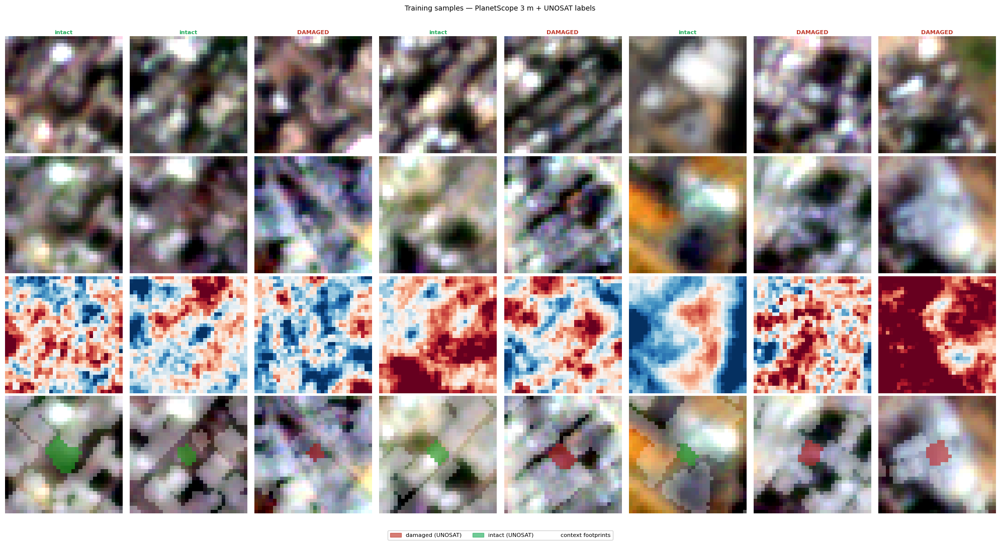

In [13]:

fig = show_samples(X_tr, y_tr, CHANNEL_NAMES, n=8, seed=42)
plt.show()

# save to Drive
fig.savefig(f'{EXP_ROOT}/figures/training_samples.png',
            dpi=150, bbox_inches='tight')

<h2>6. Augmentation</h2>

Three kinds, all switched from CONFIG.

<b>Geometric</b> flips and rotates patches during training. Brightness jitter is
deliberately absent, absolute backscatter level is the damage signal and not a nuisance
to be augmented away.

<b>Temporal label augmentation</b> uses the physics of destruction. A building marked
damaged at one date stays damaged at every later date, and before its first damaged
label it counts as intact. With several assessment dates per city this multiplies the
usable training labels. With one date it is a no op, the interface exists so it works
the day a second date is added to the registry.

<b>Spatial smoothing</b> runs at inference in Section 11, blending each score with its
nearest neighbours because damage is spatially clustered.

In [14]:
class PatchDataset(Dataset):
    """Yields patch, tabular vector and label, with optional geometric augmentation."""

    def __init__(self, X, tab, y, train=False, geometric=True):
        self.X = X
        self.tab = tab
        self.y = y
        self.augment = train and geometric

    def __len__(self):
        return len(self.y)

    def __getitem__(self, i):
        x = torch.from_numpy(self.X[i])
        if self.augment:
            if torch.rand(1).item() < 0.5:
                x = torch.flip(x, dims=[2])
            if torch.rand(1).item() < 0.5:
                x = torch.flip(x, dims=[1])
            k = int(torch.randint(0, 4, (1,)).item())
            if k:
                x = torch.rot90(x, k, dims=[1, 2])
        return (x.contiguous(), torch.from_numpy(self.tab[i]),
                torch.tensor(float(self.y[i])))


def expand_labels_over_time(frames):
    """Temporal label augmentation across assessment dates of one city.

    frames is a list of (date_string, dataframe) sorted oldest first, where the
    frames share a building id column named system:index. Returns a dictionary
    mapping date to an augmented label series. Once damaged always damaged going
    forward, and strictly before the first damaged date the label is intact.
    """
    if len(frames) < 2:
        return {date: g["class"] for date, g in frames}
    first_damaged = {}
    for date, g in frames:
        for b in set(g.loc[g["class"] == 1, "system:index"]):
            first_damaged.setdefault(b, date)
    out = {}
    for date, g in frames:
        out[date] = g["system:index"].map(
            lambda b: 1 if b in first_damaged and first_damaged[b] <= date else 0)
    return out


def spatial_smooth_scores(gdf, scores, k=8, weight=0.3):
    """Blend each score with the mean of its k nearest neighbour scores.

    Uses projected coordinates so distances are meters. weight 0 returns the
    original scores and weight 1 returns pure neighbourhood consensus.
    """
    from sklearn.neighbors import BallTree
    pts = gdf["centroid"].to_crs(3857)
    coords = np.c_[pts.apply(lambda p: p.x), pts.apply(lambda p: p.y)]
    tree = BallTree(coords)
    k_eff = min(k + 1, len(scores))
    _, nn = tree.query(coords, k=k_eff)
    neighbour_mean = scores[nn[:, 1:]].mean(axis=1)
    return (1 - weight) * scores + weight * neighbour_mean

<h2>7. Model definitions</h2>

A registry keyed by name. A new architecture is a class plus one decorator line, then it
becomes available through CONFIG. Every model accepts <code>(x, tab)</code> and returns
one logit per patch, models that ignore the tabular vector just do not use it.

Implemented: <b>small_cnn</b> (the channel stacking baseline), <b>siamese</b> (shared
encoder on pre and post, compared in feature space), <b>two_branch</b> (separate SAR and
optical towers plus an optional tabular MLP), and <b>siamese_unet</b>, which adds a
decoder back to full resolution and pools its output over the building footprint rather
than over the whole patch. <b>unet</b> is a working encoder decoder but the segmentation
training path is a guarded placeholder, per pixel labels do not exist yet in our data.
PWTT is not a torch model, it enters the evaluation table directly from the max_change
column.

In [15]:
MODEL_REGISTRY = {}

def register_model(name):
    def wrap(cls):
        MODEL_REGISTRY[name] = cls
        return cls
    return wrap


def conv_block(cin, cout):
    return nn.Sequential(nn.Conv2d(cin, cout, 3, padding=1), nn.BatchNorm2d(cout),
                         nn.ReLU(), nn.MaxPool2d(2))


@register_model("small_cnn")
class SmallCNN(nn.Module):
    """The from scratch baseline, about 25k parameters, channel stacking."""

    def __init__(self, n_channels, n_tab=0, **kw):
        super().__init__()
        self.features = nn.Sequential(conv_block(n_channels, 16),
                                      conv_block(16, 32), conv_block(32, 64))
        self.head = nn.Sequential(nn.AdaptiveAvgPool2d(1), nn.Flatten(),
                                  nn.Dropout(0.3), nn.Linear(64, 1))

    def forward(self, x, tab=None):
        return self.head(self.features(x)).squeeze(1)


@register_model("siamese")
class SiameseCNN(nn.Module):
    """Shared encoder applied to pre and post separately.

    The head sees pre features, post features and their difference. The explicit
    difference is the inductive bias that channel stacking has to discover.
    Assumes the active channels are ordered pre first then post, which
    active_channel_indices guarantees.
    """

    def __init__(self, n_channels, n_tab=0, width=32, **kw):
        super().__init__()
        assert n_channels % 2 == 0, "siamese needs matching pre and post channels"
        half = n_channels // 2
        self.half = half
        self.encoder = nn.Sequential(conv_block(half, width),
                                     conv_block(width, width * 2),
                                     conv_block(width * 2, width * 4),
                                     nn.AdaptiveAvgPool2d(1), nn.Flatten())
        feat = width * 4
        self.head = nn.Sequential(nn.Dropout(0.4), nn.Linear(3 * feat, 128),
                                  nn.ReLU(), nn.Dropout(0.2), nn.Linear(128, 1))

    def forward(self, x, tab=None):
        # channels arrive grouped by modality with pre before post inside each
        # group, set_channel_split resolved the exact indices from the names
        f_pre = self.encoder(x[:, self.pre_idx])
        f_post = self.encoder(x[:, self.post_idx])
        f = torch.cat([f_pre, f_post, f_post - f_pre], dim=1)
        return self.head(f).squeeze(1)

    def set_channel_split(self, names):
        """Called by build_model with the active channel names."""
        self.pre_idx = [i for i, n in enumerate(names) if "_pre_" in n]
        self.post_idx = [i for i, n in enumerate(names) if "_post_" in n]
        assert len(self.pre_idx) == len(self.post_idx) == self.half


@register_model("two_branch")
class TwoBranchCNN(nn.Module):
    """Separate towers per modality, SAR in dB and optical reflectance differ too
    much in statistics to share first layer filters. Optional tabular MLP."""

    def __init__(self, n_channels, n_tab=0, width=32, **kw):
        super().__init__()
        self.n_tab = n_tab
        self.sar_idx, self.opt_idx = [], []
        self.sar_tower = None
        self.opt_tower = None
        self.width = width
        feat = 0
        if n_tab > 0:
            self.tab_mlp = nn.Sequential(nn.Linear(n_tab, 32), nn.ReLU(),
                                         nn.Linear(32, 32), nn.ReLU())
        self._feat_placeholder = feat

    def set_channel_split(self, names):
        self.sar_idx = [i for i, n in enumerate(names) if n.startswith("s1")]
        self.opt_idx = [i for i, n in enumerate(names) if n.startswith("s2")]
        w = self.width

        def tower(cin):
            return nn.Sequential(conv_block(cin, w), conv_block(w, w * 2),
                                 conv_block(w * 2, w * 4),
                                 nn.AdaptiveAvgPool2d(1), nn.Flatten())
        feat = 0
        if self.sar_idx:
            self.sar_tower = tower(len(self.sar_idx))
            feat += w * 4
        if self.opt_idx:
            self.opt_tower = tower(len(self.opt_idx))
            feat += w * 4
        if self.n_tab > 0:
            feat += 32
        self.head = nn.Sequential(nn.Dropout(0.4), nn.Linear(feat, 128), nn.ReLU(),
                                  nn.Dropout(0.2), nn.Linear(128, 1))

    def forward(self, x, tab=None):
        fs = []
        if self.sar_tower is not None:
            fs.append(self.sar_tower(x[:, self.sar_idx]))
        if self.opt_tower is not None:
            fs.append(self.opt_tower(x[:, self.opt_idx]))
        if self.n_tab > 0:
            fs.append(self.tab_mlp(tab))
        return self.head(torch.cat(fs, dim=1)).squeeze(1)


@register_model("unet")
class UNetSmall(nn.Module):
    """Compact encoder decoder for per pixel damage maps.

    The architecture works, the training path does not exist yet because our
    labels are one bit per building, not per pixel masks. Section 8 raises a
    clear message if the segmentation task is selected. Rasterizing UNOSAT
    polygons into masks is the natural way to make this real.
    """

    def __init__(self, n_channels, n_tab=0, width=16, **kw):
        super().__init__()
        w = width
        self.enc1 = nn.Sequential(nn.Conv2d(n_channels, w, 3, padding=1), nn.ReLU())
        self.enc2 = nn.Sequential(nn.MaxPool2d(2), nn.Conv2d(w, w * 2, 3, padding=1), nn.ReLU())
        self.enc3 = nn.Sequential(nn.MaxPool2d(2), nn.Conv2d(w * 2, w * 4, 3, padding=1), nn.ReLU())
        self.up2 = nn.ConvTranspose2d(w * 4, w * 2, 2, stride=2)
        self.dec2 = nn.Sequential(nn.Conv2d(w * 4, w * 2, 3, padding=1), nn.ReLU())
        self.up1 = nn.ConvTranspose2d(w * 2, w, 2, stride=2)
        self.dec1 = nn.Sequential(nn.Conv2d(w * 2, w, 3, padding=1), nn.ReLU())
        self.out = nn.Conv2d(w, 1, 1)

    def forward(self, x, tab=None):
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        d2 = self.dec2(torch.cat([self.up2(e3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.out(d1).squeeze(1)


@register_model("siamese_unet")
class SiameseUNet(nn.Module):
    """Shared encoder over pre and post, U-Net decoder, footprint-masked pooling.

    Three things distinguish it from the plain siamese model above.

    <b>It is fully convolutional.</b> The decoder returns to full resolution, so
    the model reasons about where damage is inside the patch rather than
    collapsing to a global average early. At 3 m Planet resolution a building
    covers tens of pixels, which is enough for that to matter.

    <b>The footprint channels enter both branches.</b> fp_target marks the
    building this row is labelled about and fp_context marks its neighbours. Both
    are identical pre and post, so they survive the |pre - post| difference as
    constants and act as pointers: the encoder learns which pixels belong to the
    target, which to other buildings, and which to street or field.

    <b>The score is pooled over fp_target, not the patch.</b> This is the paper's
    decision rule made differentiable — mean logit inside the footprint, one
    number per building. Pooling over the whole patch, or over all footprints,
    would let a neighbour's rubble decide this row's label, which is precisely
    the spillover the paper measures in Section 3.3.
    """

    def __init__(self, n_channels, n_tab=0, width=32, depth=3,
                 fp_index=None, fp_channels=0, pre_idx=None, post_idx=None, **kw):
        super().__init__()
        # Index lists, not a contiguous slice. With two sensors enabled the
        # channels interleave as s1_pre, s1_post, ps_pre, ps_post, so slicing
        # the first half would hand the encoder a mix of both periods.
        self.register_buffer("pre_idx", torch.tensor(pre_idx), persistent=False)
        self.register_buffer("post_idx", torch.tensor(post_idx), persistent=False)
        self.fp_index = fp_index            # first footprint channel, the target
        self.fp_channels = fp_channels      # target plus context
        in_ch = len(pre_idx) + fp_channels

        ch = [width * 2**i for i in range(depth + 1)]
        self.enc = nn.ModuleList([
            nn.Sequential(nn.Conv2d(c, o, 3, padding=1, bias=False),
                          nn.BatchNorm2d(o), nn.ReLU(True),
                          nn.Conv2d(o, o, 3, padding=1, bias=False),
                          nn.BatchNorm2d(o), nn.ReLU(True))
            for c, o in zip([in_ch] + ch[:-2], ch[:-1])])
        self.mid = nn.Sequential(
            nn.Conv2d(ch[-2] * 3, ch[-1], 3, padding=1, bias=False),
            nn.BatchNorm2d(ch[-1]), nn.ReLU(True))
        self.up = nn.ModuleList([nn.ConvTranspose2d(ch[i+1], ch[i], 2, 2)
                                 for i in reversed(range(depth))])
        self.dec = nn.ModuleList([
            nn.Sequential(nn.Conv2d(ch[i] * 4, ch[i], 3, padding=1, bias=False),
                          nn.BatchNorm2d(ch[i]), nn.ReLU(True))
            for i in reversed(range(depth))])
        self.head = nn.Conv2d(width, 1, 1)
        self.depth = depth

    def encode(self, x):
        skips = []
        for b in self.enc:
            x = b(x)
            skips.append(x)
            x = F.max_pool2d(x, 2)
        return skips, x

    def forward(self, x, tab=None):
        fi = self.fp_index
        pre, post = x[:, self.pre_idx], x[:, self.post_idx]
        if fi is not None:
            fpc = x[:, fi:fi + self.fp_channels]     # target and context planes
            pre = torch.cat([pre, fpc], 1)
            post = torch.cat([post, fpc], 1)

        sa, a = self.encode(pre)
        sb, b = self.encode(post)
        h = self.mid(torch.cat([a, b, (a - b).abs()], 1))
        for i, (up, dec) in enumerate(zip(self.up, self.dec)):
            l = self.depth - 1 - i
            h = dec(torch.cat([up(h), sa[l], sb[l], (sa[l] - sb[l]).abs()], 1))
        logits = self.head(h)                                  # B,1,H,W

        if fi is None:
            return logits.mean(dim=(1, 2, 3))
        # mean logit inside the target footprint only. Rows with an empty target
        # mask are dropped during extraction, so the clamp is belt and braces.
        m = x[:, fi:fi + 1]
        return (logits * m).sum(dim=(1, 2, 3)) / m.sum(dim=(1, 2, 3)).clamp(min=1)


def set_channel_split(cfg=None):
    """Resolve where pre ends, post begins and the footprint mask sits.

    Siamese models need matching pre and post blocks. The footprint mask is
    neither, so it is excluded from the halves and passed separately.
    """
    cfg = cfg or CONFIG
    names = wanted_channel_names(cfg)
    fp = [i for i, n in enumerate(names) if n.startswith("fp_")]
    pre = [i for i, n in enumerate(names) if "_pre_" in n]
    post = [i for i, n in enumerate(names) if "_post_" in n]
    if len(pre) != len(post):
        raise ValueError(f"siamese needs matching pre and post channels, "
                         f"got {len(pre)} pre and {len(post)} post")
    # the two lists must line up sensor by sensor, or the difference compares
    # SAR against optical
    if [names[i].replace("_pre_", "_") for i in pre] != \
       [names[i].replace("_post_", "_") for i in post]:
        raise ValueError("pre and post channels do not correspond one to one")
    return {"pre_idx": pre, "post_idx": post,
            "fp_index": fp[0] if fp else None, "fp_channels": len(fp)}

def build_model(cfg):
    cls = MODEL_REGISTRY[cfg["model"]]
    kw = {}
    if cfg["model"] == "siamese_unet":
        kw = set_channel_split(cfg)
        print(f"  channel split: {len(kw['pre_idx'])} pre + {len(kw['post_idx'])} post"
              + (f" + footprint mask at index {kw['fp_index']}"
                 if kw["fp_index"] is not None else ""))
    kw.update(cfg.get("model_kwargs", {}))
    model = cls(n_channels=N_CHANNELS, n_tab=N_TAB, **kw)
    n = sum(p.numel() for p in model.parameters())
    print(f"model {cfg['model']}: {n:,} parameters")
    return model.to(device)


<h2>8. Training</h2>

One protocol for every architecture so comparisons measure models, not recipes.
Class weighted loss for imbalance, early stopping on validation PR AUC because under
imbalance the loss can improve while ranking quality falls, best checkpoint restored
and saved together with the normalization statistics. Cities without those statistics
cannot be scored correctly later, so they travel with the weights.

In [16]:
def train(cfg, model):
    if cfg["task"] == "segmentation":
        raise NotImplementedError(
            "segmentation training needs per pixel masks, rasterize the UNOSAT "
            "polygons into label images and add a SegmentationDataset here")

    geo = cfg["augmentation"]["geometric"]
    tr_dl = DataLoader(PatchDataset(X_tr, tab_tr, y_tr, train=True, geometric=geo),
                       batch_size=cfg["batch_size"], shuffle=True, drop_last=True)
    va_dl = DataLoader(PatchDataset(X_va, tab_va, y_va), batch_size=256)

    pos_weight = torch.tensor([(len(y_tr) - y_tr.sum()) / max(y_tr.sum(), 1)],
                              dtype=torch.float32, device=device)
    crit = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    opt = torch.optim.AdamW(model.parameters(), lr=cfg["learning_rate"],
                            weight_decay=1e-4)
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=cfg["max_epochs"])


    @torch.no_grad()
    def val_scores():
        model.eval()
        out = []
        for xb, tb, _ in va_dl:
            out.append(torch.sigmoid(model(xb.to(device), tb.to(device))).cpu())
        return torch.cat(out).numpy()

    best_ap, best_epoch, best_state, bad, history = -np.inf, -1, None, 0, []
    for ep in range(1, cfg["max_epochs"] + 1):
        model.train()
        tot, seen = 0.0, 0
        for xb, tb, yb in tr_dl:
            xb, tb, yb = xb.to(device), tb.to(device), yb.to(device)
            opt.zero_grad(set_to_none=True)
            loss = crit(model(xb, tb), yb)
            loss.backward()
            opt.step()
            tot += loss.item() * len(yb)
            seen += len(yb)

        sched.step()



        va_ap = average_precision_score(y_va, val_scores())
        history.append((ep, tot / seen, va_ap))
        star = ""
        if va_ap > best_ap + 1e-4:
            best_ap, best_epoch, bad = va_ap, ep, 0
            best_state = copy.deepcopy(model.state_dict())
            star = "  best so far"
        else:
            bad += 1
        print(f"epoch {ep:3d}  train loss {tot / seen:.4f}  val PR AUC {va_ap:.4f}{star}")
        if bad >= cfg["early_stopping_patience"]:
            print(f"early stop at epoch {ep}, best was epoch {best_epoch}")
            break

    model.load_state_dict(best_state)

    # the threshold is selected on validation, test stays untouched until Section 9
    va_probs = val_scores()
    prec, rec, thr = precision_recall_curve(y_va, va_probs)
    f1 = 2 * prec[:-1] * rec[:-1] / (prec[:-1] + rec[:-1] + 1e-9)
    val_threshold = float(thr[np.argmax(f1)])

    ckpt_path = os.path.join(OUT["models"], f"{cfg['model']}.pt")
    torch.save({"state_dict": best_state, "mu": mu, "sd": sd,
                "tab_mu": tab_mu, "tab_sd": tab_sd,
                "channel_names": CHANNEL_NAMES, "config": cfg,
                "best_epoch": best_epoch, "val_ap": best_ap,
                "val_threshold": val_threshold}, ckpt_path)
    print(f"saved {ckpt_path}  (best epoch {best_epoch}, "
          f"val PR AUC {best_ap:.4f}, threshold {val_threshold:.3f})")
    return {"history": np.array(history), "best_epoch": best_epoch,
            "val_ap": best_ap, "val_threshold": val_threshold}


model = build_model(CONFIG)
run = train(CONFIG, model)

  channel split: 6 pre + 6 post + footprint mask at index 12
model siamese_unet: 133,393 parameters
epoch   1  train loss 0.3055  val PR AUC 0.8835  best so far
epoch   2  train loss 0.2833  val PR AUC 0.8857  best so far
epoch   3  train loss 0.2711  val PR AUC 0.8724
epoch   4  train loss 0.2625  val PR AUC 0.8789
epoch   5  train loss 0.2553  val PR AUC 0.8909  best so far
epoch   6  train loss 0.2498  val PR AUC 0.8815
epoch   7  train loss 0.2451  val PR AUC 0.8790
epoch   8  train loss 0.2411  val PR AUC 0.8985  best so far
epoch   9  train loss 0.2377  val PR AUC 0.8920
epoch  10  train loss 0.2350  val PR AUC 0.8852
epoch  11  train loss 0.2326  val PR AUC 0.8974
epoch  12  train loss 0.2309  val PR AUC 0.8712
epoch  13  train loss 0.2275  val PR AUC 0.8849
epoch  14  train loss 0.2260  val PR AUC 0.8863
epoch  15  train loss 0.2248  val PR AUC 0.8856
epoch  16  train loss 0.2229  val PR AUC 0.8751
epoch  17  train loss 0.2217  val PR AUC 0.8741
epoch  18  train loss 0.2201  va

<h2>9. Evaluation</h2>

Scores every test region separately, Gaza south tells us about within city
generalization, the Syrian and Ukrainian cities about cross conflict transfer. The PWTT
max_change statistic at its published threshold 3.3 is the external baseline in every
region. All metrics are written to the experiment folder as CSV.

In [17]:
PWTT_THRESHOLD = 3.3


@torch.no_grad()
def predict_probs(model, X, tab, batch=256):
    model.eval()
    out = []
    for i in range(0, len(X), batch):
        xb = torch.from_numpy(X[i:i + batch]).to(device)
        tb = torch.from_numpy(tab[i:i + batch]).to(device)
        out.append(torch.sigmoid(model(xb, tb)).cpu().numpy())
    return np.concatenate(out)


def binary_metrics(y_true, score, thresh):
    p, r, f1, _ = precision_recall_fscore_support(
        y_true, (score >= thresh).astype(int), average="binary", zero_division=0)
    row = {"P": p, "R": r, "F1": f1,
           "PR_AUC": average_precision_score(y_true, score),
           "ROC_AUC": roc_auc_score(y_true, score),
           "prevalence": float(np.mean(y_true)), "n": len(y_true)}
    return row


def evaluate_regions(model, parts, val_threshold):
    rows = {}
    for p in parts:
        Xn = (p["X"] - mu) / sd
        tn = (p["tab"] - tab_mu) / tab_sd
        probs = predict_probs(model, Xn, tn)
        p["probs"] = probs
        rows[f"{p['name']}  CNN"] = binary_metrics(p["y"], probs, val_threshold)
        mc = p["gdf"]["max_change"].values
        rows[f"{p['name']}  PWTT"] = binary_metrics(p["y"], mc, PWTT_THRESHOLD)
    return pd.DataFrame(rows).T


results = evaluate_regions(model, test_parts, run["val_threshold"])
results.round(4).to_csv(os.path.join(OUT["metrics"], "test_metrics.csv"))
with open(os.path.join(OUT["metrics"], "run_summary.json"), "w") as fh:
    json.dump({"best_epoch": run["best_epoch"], "val_ap": run["val_ap"],
               "val_threshold": run["val_threshold"]}, fh, indent=2)
results.round(4)

,P,R,F1,PR_AUC,ROC_AUC,prevalence,n
Gaza:0.00-0.33 CNN,0.5741,0.8368,0.6810,0.6823,0.7958,0.3877,75479.0
Gaza:0.00-0.33 PWTT,0.6181,0.5188,0.5641,0.6131,0.7199,0.3877,75479.0


In [22]:
print(f'val_threshold: {run["val_threshold"]:.3f}')

# score distribution on the test set
import torch
from torch.utils.data import DataLoader
test_probs = np.concatenate([
    p["probs"] for p in test_parts
])
print(f'test scores: min={test_probs.min():.3f}  '
      f'median={np.median(test_probs):.3f}  '
      f'mean={test_probs.mean():.3f}  '
      f'max={test_probs.max():.3f}')
print(f'% predicted damaged at threshold {run["val_threshold"]:.3f}: '
      f'{100*(test_probs > run["val_threshold"]).mean():.1f}%')
print(f'actual % damaged in test: {100*np.concatenate([p["y"] for p in test_parts]).mean():.1f}%')

val_threshold: 0.477
test scores: min=0.201  median=0.576  mean=0.561  max=0.998
% predicted damaged at threshold 0.477: 56.5%
actual % damaged in test: 38.8%


In [23]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import numpy as np

y_test = np.concatenate([p["y"] for p in test_parts])
test_probs = np.concatenate([p["probs"] for p in test_parts])

# how much does F1 improve with an oracle threshold?
p_, r_, t_ = precision_recall_curve(y_test, test_probs)
f1_ = 2*p_*r_ / np.maximum(p_+r_, 1e-9)
best_t = t_[np.argmax(f1_[:-1])]
best_f1 = np.max(f1_[:-1])
pred = (test_probs > best_t).astype(int)
P = pred[y_test==1].mean()
R = (pred * (y_test==1)).sum() / (y_test==1).sum()
print(f'oracle threshold: {best_t:.3f}')
print(f'oracle F1: {best_f1:.3f}  P: {P:.3f}  R: {R:.3f}')
print(f'val threshold F1: 0.681  (from evaluate_regions)')

# PWTT on same rows with oracle threshold too
mc = np.concatenate([p["gdf"]["max_change"].values for p in test_parts])
p_, r_, t_ = precision_recall_curve(y_test, mc)
f1_ = 2*p_*r_ / np.maximum(p_+r_, 1e-9)
pwtt_best = t_[np.argmax(f1_[:-1])]
pwtt_f1 = np.max(f1_[:-1])
print(f'\nPWTT oracle threshold: {pwtt_best:.3f}  F1: {pwtt_f1:.3f}')
print(f'PWTT fixed threshold:  3.3          F1: 0.564  (from evaluate_regions)')

oracle threshold: 0.566
oracle F1: 0.685  P: 0.790  R: 0.790
val threshold F1: 0.681  (from evaluate_regions)

PWTT oracle threshold: 2.627  F1: 0.612
PWTT fixed threshold:  3.3          F1: 0.564  (from evaluate_regions)


<h2>10. Visualization</h2>

Training curve, precision recall curves per region and a spatial error map for one
region. Every figure is saved into the experiment folder so runs can be compared side
by side later.

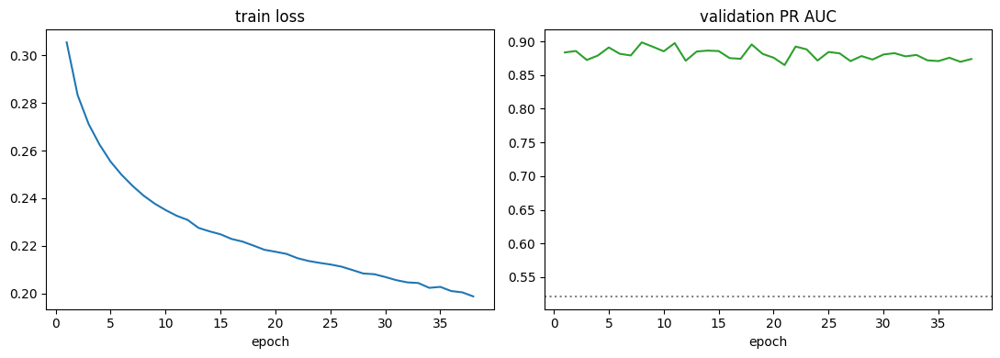

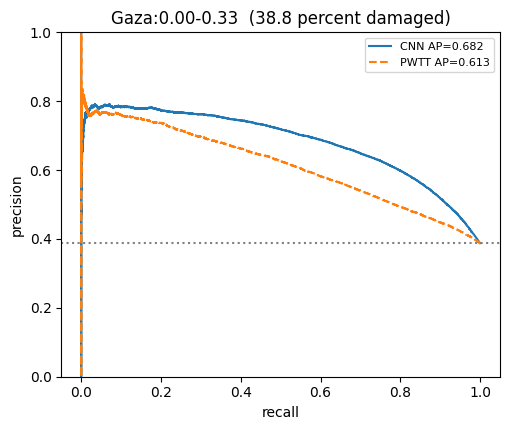

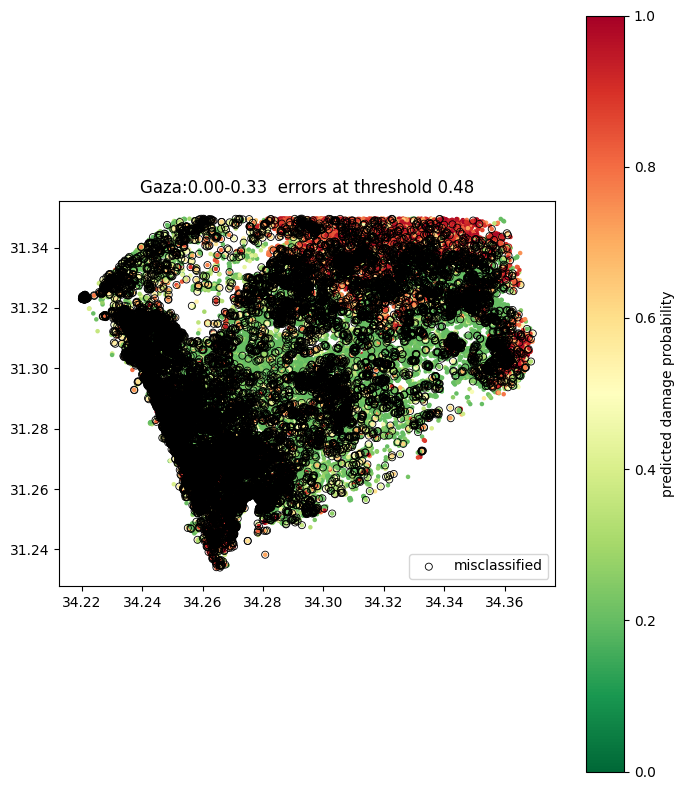

In [24]:
def plot_training(history, path):
    fig, ax = plt.subplots(1, 2, figsize=(11, 4))
    ax[0].plot(history[:, 0], history[:, 1])
    ax[0].set_xlabel("epoch")
    ax[0].set_title("train loss")
    ax[1].plot(history[:, 0], history[:, 2], color="C2")
    ax[1].axhline(y_va.mean(), color="gray", ls=":")
    ax[1].set_xlabel("epoch")
    ax[1].set_title("validation PR AUC")
    plt.tight_layout()
    fig.savefig(path, dpi=150)
    plt.show()


def plot_pr_curves(parts, path):
    n = len(parts)
    fig, axes = plt.subplots(1, n, figsize=(5.2 * n, 4.4))
    axes = np.atleast_1d(axes)
    for ax, p in zip(axes, parts):
        pr, rc, _ = precision_recall_curve(p["y"], p["probs"])
        ax.plot(rc, pr, label=f"CNN AP={average_precision_score(p['y'], p['probs']):.3f}")
        mc = p["gdf"]["max_change"].values
        pr2, rc2, _ = precision_recall_curve(p["y"], mc)
        ax.plot(rc2, pr2, "--", label=f"PWTT AP={average_precision_score(p['y'], mc):.3f}")
        ax.axhline(p["y"].mean(), color="gray", ls=":")
        ax.set_ylim(0, 1)
        ax.set_title(f"{p['name']}  ({p['y'].mean() * 100:.1f} percent damaged)")
        ax.set_xlabel("recall")
        ax.legend(fontsize=8)
    axes[0].set_ylabel("precision")
    plt.tight_layout()
    fig.savefig(path, dpi=150)
    plt.show()


def plot_error_map(part, threshold, path):
    gdf = part["gdf"]
    probs = part["probs"]
    pred = (probs >= threshold).astype(int)
    xs = gdf["centroid"].apply(lambda p: p.x)
    ys = gdf["centroid"].apply(lambda p: p.y)
    fig, ax = plt.subplots(figsize=(7, 8))
    sc = ax.scatter(xs, ys, c=probs, s=5, cmap="RdYlGn_r", vmin=0, vmax=1)
    wrong = pred != part["y"]
    ax.scatter(xs[wrong], ys[wrong], facecolors="none", edgecolors="black",
               s=26, linewidths=0.6, label="misclassified")
    plt.colorbar(sc, ax=ax, label="predicted damage probability")
    ax.set_title(f"{part['name']}  errors at threshold {threshold:.2f}")
    ax.set_aspect("equal")
    ax.legend(loc="lower right")
    plt.tight_layout()
    fig.savefig(path, dpi=150)
    plt.show()


plot_training(run["history"], os.path.join(OUT["figures"], "training.png"))
plot_pr_curves(test_parts, os.path.join(OUT["figures"], "pr_curves.png"))
plot_error_map(test_parts[0], run["val_threshold"],
               os.path.join(OUT["figures"], "error_map.png"))

<h2>11. Inference</h2>

Applies a trained checkpoint to any registered city and writes a GeoJSON of footprints
with probabilities, ready for GIS tools or the interactive map. Spatial smoothing from
Section 6 is applied here when enabled, neighbour consensus at prediction time is the
cheap version of spatial context modelling. A learned spatial context model, for
example a graph network over building adjacency, would slot in at this same point.

In [25]:
def predict_city(city, model=model, cfg=CONFIG, date=None):
    """Score every extracted building of one city and return its GeoDataFrame."""
    d = get_city(city, date, cfg)
    Xn = (select_channels(d, cfg) - mu) / sd
    tn = (d["tab"] - tab_mu) / tab_sd
    probs = predict_probs(model, Xn, tn)

    smooth_cfg = cfg["augmentation"]["spatial_smoothing"]
    if smooth_cfg["enabled"]:
        probs = spatial_smooth_scores(d["gdf"], probs,
                                      k=smooth_cfg["k"], weight=smooth_cfg["weight"])

    out = d["gdf"][["geometry", "class", "max_change"]].copy()
    out["prob"] = probs
    out["pred"] = (probs >= run["val_threshold"]).astype(int)
    path = os.path.join(OUT["predictions"], f"{city}_{d['date']}.geojson")
    out.drop(columns=[c for c in ["centroid"] if c in out]).to_file(path, driver="GeoJSON")
    print(f"wrote {path}")
    return out


gaza_pred = predict_city("Gaza")
gaza_pred.head(3)

wrote /content/drive/MyDrive/Colab Notebooks/War_Damage/experiments/exp004_siamese_unet_planet/predictions/Gaza_20240503.geojson


,geometry,class,max_change,prob,pred
0,"POLYGON ((34.46207 31.50395, 34.46216 31.50391...",1,3.871787,0.314208,0
1,"POLYGON ((34.46413 31.50427, 34.4642 31.50424,...",1,4.962139,0.801931,1
2,"POLYGON ((34.45821 31.5323, 34.45831 31.53217,...",1,4.197910,0.867961,1


<h2>12. Explainable AI</h2>

Three complementary views of what the model uses.

<b>Grad-CAM</b> shows which pixels of a patch drove one prediction, useful for checking
that the model looks at the building and not at an artifact.
<b>Modality ablation</b> zeroes one channel group at a time and measures the PR AUC
drop, the honest answer to which sensor matters.
<b>Permutation importance</b> shuffles one tabular feature at a time, only meaningful
when pwtt_tabular is enabled. SHAP would give per building attributions for the tabular
branch and is left as a marked extension point.

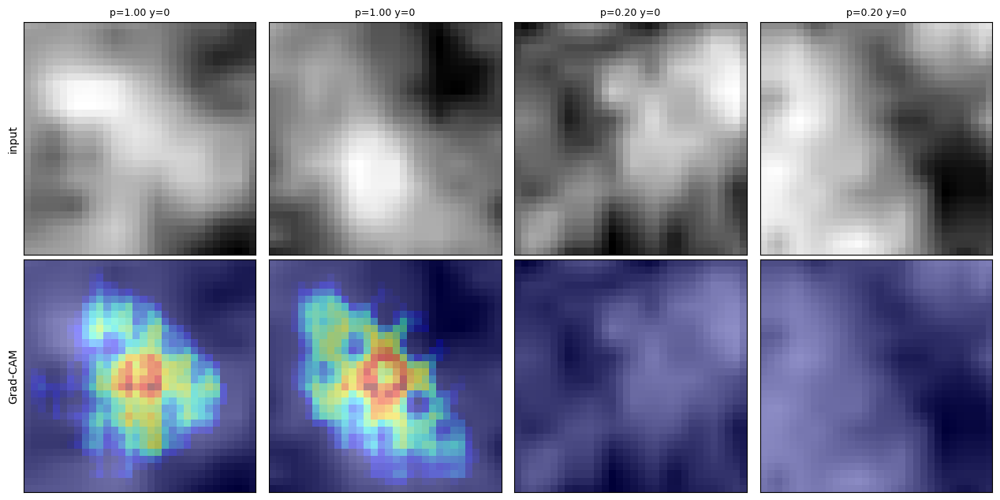

full input         0.6823
without s1 pre     0.6658
without s1 post    0.5776
without ps pre     0.6352
without ps post    0.5257
without fp post    0.3877
Name: PR_AUC, dtype: float64
pwtt_tabular is disabled in this run, nothing to permute


In [26]:
def grad_cam(model, x, tab):
    """Gradient weighted class activation map from the last conv layer."""
    convs = [m for m in model.modules() if isinstance(m, nn.Conv2d)]
    target = convs[-1]
    acts, grads = {}, {}

    def fwd_hook(module, inp, out):
        acts["v"] = out.detach()

    def bwd_hook(module, gin, gout):
        grads["v"] = gout[0].detach()

    h1 = target.register_forward_hook(fwd_hook)
    h2 = target.register_full_backward_hook(bwd_hook)
    model.eval()
    xb = torch.from_numpy(x[None]).to(device).requires_grad_(True)
    tb = torch.from_numpy(tab[None]).to(device)
    logit = model(xb, tb)
    model.zero_grad()
    logit.backward()
    h1.remove()
    h2.remove()

    weight = grads["v"].mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weight * acts["v"]).sum(dim=1))[0].cpu().numpy()
    cam = cam - cam.min()
    if cam.max() > 0:
        cam = cam / cam.max()
    return cam, float(torch.sigmoid(logit).item())


def show_grad_cam_examples(part, n=4, path=None):
    """Grad-CAM for the highest scoring damaged and intact examples of a region."""
    Xn = (part["X"] - mu) / sd
    tn = (part["tab"] - tab_mu) / tab_sd
    order = np.argsort(-part["probs"])
    picks = list(order[:n // 2]) + list(order[-(n - n // 2):])
    fig, axes = plt.subplots(2, len(picks), figsize=(3.2 * len(picks), 6.4))
    for col, j in enumerate(picks):
        cam, prob = grad_cam(model, Xn[j], tn[j])
        cam_big = np.kron(cam, np.ones((Xn.shape[2] // cam.shape[0],
                                        Xn.shape[3] // cam.shape[1])))
        base = Xn[j, min(2, Xn.shape[0] - 1)]
        axes[0, col].imshow(base, cmap="gray")
        axes[0, col].set_title(f"p={prob:.2f} y={part['y'][j]}", fontsize=9)
        axes[1, col].imshow(base, cmap="gray")
        axes[1, col].imshow(cam_big, cmap="jet", alpha=0.45)
        for ax in (axes[0, col], axes[1, col]):
            ax.set_xticks([])
            ax.set_yticks([])
    axes[0, 0].set_ylabel("input")
    axes[1, 0].set_ylabel("Grad-CAM")
    plt.tight_layout()
    if path:
        fig.savefig(path, dpi=150)
    plt.show()


def modality_ablation(part):
    """PR AUC after zeroing each channel group, big drop means the group matters."""
    groups = {}
    for i, name in enumerate(CHANNEL_NAMES):
        key = name.split("_")[0] + " " + ("pre" if "_pre_" in name else "post")
        groups.setdefault(key, []).append(i)
    Xn = (part["X"] - mu) / sd
    tn = (part["tab"] - tab_mu) / tab_sd
    base = average_precision_score(part["y"], predict_probs(model, Xn, tn))
    rows = {"full input": base}
    for key, idx in groups.items():
        Xz = Xn.copy()
        Xz[:, idx] = 0.0
        rows[f"without {key}"] = average_precision_score(
            part["y"], predict_probs(model, Xz, tn))
    return pd.Series(rows, name="PR_AUC")


def permutation_importance_tab(part, repeats=3):
    """Shuffle one tabular feature at a time, only meaningful with pwtt_tabular on."""
    if N_TAB == 0:
        print("pwtt_tabular is disabled in this run, nothing to permute")
        return None
    rng = np.random.default_rng(CONFIG["seed"])
    Xn = (part["X"] - mu) / sd
    tn = (part["tab"] - tab_mu) / tab_sd
    base = average_precision_score(part["y"], predict_probs(model, Xn, tn))
    rows = {}
    for j, name in enumerate(TAB_FEATURES):
        drops = []
        for _ in range(repeats):
            tp = tn.copy()
            rng.shuffle(tp[:, j])
            drops.append(base - average_precision_score(
                part["y"], predict_probs(model, Xn, tp)))
        rows[name] = float(np.mean(drops))
    return pd.Series(rows, name="PR_AUC drop").sort_values(ascending=False)

# SHAP extension point: shap.DeepExplainer on the tabular branch would give per
# building attributions, add it here once the fusion model is the main model.

show_grad_cam_examples(test_parts[0], n=4,
                       path=os.path.join(OUT["figures"], "grad_cam.png"))
abl = modality_ablation(test_parts[0])
print(abl.round(4))
perm = permutation_importance_tab(test_parts[0])
if perm is not None:
    print(perm.round(4))

<h2>13. Interactive comparison map</h2>

A folium map over RGB satellite imagery for visual quality control and for the long
term goal of a living damage map. Layers, each toggleable in the control:

<ul>
<li><b>Ground truth</b>, footprints coloured by the UNOSAT label</li>
<li><b>Prediction</b>, footprints coloured by model confidence</li>
<li><b>Disagreements</b>, false positives and false negatives outlined so they jump out</li>
</ul>

Tooltips show probability, label and the PWTT statistic per building. When a city has
several prediction files, one per assessment date, the date selector rebuilds the map.
This runs on plain folium tiles, no Earth Engine session needed.

In [27]:
import folium
import matplotlib


def prob_to_color(p):
    return matplotlib.colors.to_hex(matplotlib.colormaps["RdYlGn_r"](float(p)))


def build_comparison_map(pred_gdf, title="damage map", max_features=4000):
    """Folium map with ground truth, predictions and disagreement layers."""
    g = pred_gdf
    if len(g) > max_features:
        g = g.sample(max_features, random_state=0)
    g = g.copy()
    g["color_pred"] = [prob_to_color(p) for p in g["prob"]]
    g["color_true"] = np.where(g["class"] == 1, "#C0392B", "#4C72B0")
    g["agree"] = g["pred"] == g["class"]

    center = [g.geometry.centroid.y.mean(), g.geometry.centroid.x.mean()]
    m = folium.Map(location=center, zoom_start=14, tiles=None)
    folium.TileLayer(
        tiles="https://server.arcgisonline.com/ArcGIS/rest/services/"
              "World_Imagery/MapServer/tile/{z}/{y}/{x}",
        attr="Esri World Imagery", name="RGB satellite").add_to(m)

    def add_layer(frame, color_col, name, show, weight=1, fill=0.7, outline=None):
        fields = ["prob", "class", "pred", "max_change"]
        gj = folium.GeoJson(
            frame[["geometry", "prob", "class", "pred", "max_change", color_col]].to_json(),
            name=name,
            show=show,
            style_function=lambda f, cc=color_col, w=weight, fo=fill, ol=outline: {
                "color": ol or f["properties"][cc],
                "fillColor": f["properties"][cc],
                "weight": w,
                "fillOpacity": fo,
            },
            tooltip=folium.GeoJsonTooltip(fields=fields,
                                          aliases=["confidence", "true label",
                                                   "predicted", "PWTT max_change"]))
        gj.add_to(m)

    add_layer(g, "color_true", "ground truth", show=False)
    add_layer(g, "color_pred", "prediction confidence", show=True)
    dis = g[~g["agree"]]
    if len(dis):
        add_layer(dis, "color_pred", "disagreements", show=True,
                  weight=3, fill=0.0, outline="#00FFFF")
    folium.LayerControl(collapsed=False).add_to(m)
    return m


def comparison_map_with_dates(city):
    """Wrap the map in a date dropdown when the city has several predictions."""
    files = sorted(f for f in os.listdir(OUT["predictions"])
                   if f.startswith(city) and f.endswith(".geojson"))
    if not files:
        raise FileNotFoundError(f"no prediction files for {city}, run Section 11 first")

    def load(fname):
        return gpd.read_file(os.path.join(OUT["predictions"], fname))

    if len(files) == 1:
        return build_comparison_map(load(files[0]), title=files[0])
    try:
        import ipywidgets as widgets
        from IPython.display import display, clear_output
        dropdown = widgets.Dropdown(options=files, description="date")
        out = widgets.Output()

        def on_change(change):
            if change["name"] == "value":
                with out:
                    clear_output()
                    display(build_comparison_map(load(change["new"])))
        dropdown.observe(on_change, names="value")
        with out:
            display(build_comparison_map(load(files[0])))
        display(dropdown, out)
    except ImportError:
        print("ipywidgets missing, showing the newest date only")
        return build_comparison_map(load(files[-1]))


comparison_map_with_dates("Gaza")

/tmp/ipykernel_9628/3711485480.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [g.geometry.centroid.y.mean(), g.geometry.centroid.x.mean()]
/usr/local/lib/python3.12/dist-packages/folium/features.py:1204: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'prob': 0.90180063, 'class': 1, 'pred': 1, 'max_change': 4.630429629585487, 'color_true': '#C0392B'}] to MultiPolygon for full functionality.
https://tools.ietf.org/html/rfc7946#page-9
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/folium/features.py:1204: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'prob': 0.90180063, 'class': 1, 'pred': 1, 'max_change': 4.630429629585487, 'color_pred

In [28]:
# Two options for a time-correct basemap.
#
# Option A (recommended): Earth Engine serves a Sentinel-2 tile layer filtered
# to the post-war window. Works as interactive map tiles, no file needed.
#
# Option B: use the Planet post composite already on Drive. Shows exactly what
# the model saw, but needs reprojection + PNG export (~30 seconds).

# ---------------------------------------------------------------- Option A --
def make_ee_tile_url(aoi_bounds, date_start="2024-05-01", date_end="2024-06-15",
                     project="satelite-data-504215"):
    """
    Returns a Leaflet-compatible tile URL for a cloud-free Sentinel-2 composite
    over the post-war window. Uses the EE Maps API — no export, no quota.
    """
    import ee
    try:
        ee.Initialize(project=project)
    except Exception:
        ee.Authenticate(auth_mode='colab')
        ee.Initialize(project=project)

    west, south, east, north = aoi_bounds
    aoi = ee.Geometry.Rectangle([west, south, east, north])

    s2 = (ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
          .filterBounds(aoi)
          .filterDate(date_start, date_end)
          .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 20))
          .median()
          .select(["B4", "B3", "B2"])       # R G B
          .visualize(min=0, max=3000, gamma=1.4))

    info = s2.getMapId()
    return info["tile_fetcher"].url_format


# ---------------------------------------------------------------- Option B --
def planet_post_to_png(raster_path, out_png, scale=10, pct=(2, 98)):
    """
    Read the Planet post composite (bands 5-8 of the stacked tif), downsample
    by `scale`, stretch to 0-255 and write a georeferenced PNG that Folium can
    overlay as an ImageOverlay.

    Returns the (west, south, east, north) bounds in WGS84 for Folium.
    """
    import rasterio, numpy as np
    from rasterio.warp import calculate_default_transform, reproject, Resampling
    from PIL import Image

    with rasterio.open(raster_path) as src:
        # bands 5,6,7 = post_B, post_G, post_R -> display RGB = 7,6,5
        H2, W2 = src.height // scale, src.width // scale
        r = src.read(7, out_shape=(H2, W2),
                     resampling=Resampling.average).astype("float32")
        g = src.read(6, out_shape=(H2, W2),
                     resampling=Resampling.average).astype("float32")
        b = src.read(5, out_shape=(H2, W2),
                     resampling=Resampling.average).astype("float32")
        src_crs  = src.crs
        src_bounds = src.bounds

    # reproject bounds to WGS84 for Folium
    from rasterio.warp import transform_bounds
    west, south, east, north = transform_bounds(
        src_crs, "EPSG:4326",
        src_bounds.left, src_bounds.bottom,
        src_bounds.right, src_bounds.top)

    def stretch(arr):
        lo, hi = np.percentile(arr[arr > 0], pct) if (arr > 0).any() else (0, 1)
        return np.clip((arr - lo) / max(hi - lo, 1e-6) * 255, 0, 255).astype("uint8")

    rgb = np.stack([stretch(r), stretch(g), stretch(b)], axis=-1)
    Image.fromarray(rgb).save(out_png)
    print(f"saved {out_png}  ({W2}x{H2} px)")
    return west, south, east, north


# ------------------------------------------------------------------ Map -----
def build_comparison_map(pred_gdf, title="damage map", max_features=4000,
                         basemap="ee",          # "ee" or "planet" or "esri"
                         planet_raster=None,    # path to the ps tif (option B)
                         planet_png=None,       # where to cache the png (option B)
                         ee_project="satelite-data-504215"):
    """
    Folium map with ground truth, predictions and disagreement layers.
    basemap options:
        "ee"     — Sentinel-2 post-war tiles from Earth Engine (recommended)
        "planet" — Planet post composite from Drive (shows exactly training data)
        "esri"   — original Esri World Imagery (no date guarantee)
    """
    import folium
    import matplotlib

    def prob_to_color(p):
        return matplotlib.colors.to_hex(
            matplotlib.colormaps["RdYlGn_r"](float(p)))

    g = pred_gdf.copy()
    if len(g) > max_features:
        g = g.sample(max_features, random_state=0)

    g["color_pred"] = [prob_to_color(p) for p in g["prob"]]
    g["color_true"] = np.where(g["class"] == 1, "#C0392B", "#4C72B0")
    g["agree"]      = g["pred"] == g["class"]

    center = [g.geometry.centroid.y.mean(), g.geometry.centroid.x.mean()]
    m = folium.Map(location=center, zoom_start=14, tiles=None)

    # ---- basemap --------------------------------------------------------
    if basemap == "ee":
        bounds_wgs84 = g.to_crs(4326).total_bounds          # w s e n
        try:
            url = make_ee_tile_url(bounds_wgs84,
                                   date_start="2024-05-01",
                                   date_end="2024-06-30",
                                   project=ee_project)
            folium.TileLayer(tiles=url,
                             attr="Sentinel-2 SR, May-Jun 2024 (Google Earth Engine)",
                             name="Sentinel-2 post-war (May-Jun 2024)").add_to(m)
        except Exception as e:
            print(f"EE tile layer failed ({e}), falling back to Esri")
            basemap = "esri"

    if basemap == "planet":
        import os
        png = planet_png or "/content/planet_post.png"
        if not os.path.exists(png):
            bounds = planet_post_to_png(planet_raster, png, scale=10)
        else:
            import rasterio
            from rasterio.warp import transform_bounds
            with rasterio.open(planet_raster) as src:
                bounds = transform_bounds(src.crs, "EPSG:4326",
                                         *[getattr(src.bounds, k)
                                           for k in ("left","bottom","right","top")])
        west, south, east, north = bounds
        folium.raster_layers.ImageOverlay(
            image=png,
            bounds=[[south, west], [north, east]],
            opacity=1.0,
            name="Planet post composite (May-Jun 2024)",
            interactive=False).add_to(m)

    if basemap == "esri":
        folium.TileLayer(
            tiles="https://server.arcgisonline.com/ArcGIS/rest/services/"
                  "World_Imagery/MapServer/tile/{z}/{y}/{x}",
            attr="Esri World Imagery (date unknown)",
            name="Esri World Imagery").add_to(m)

    # ---- feature layers -------------------------------------------------
    def add_layer(frame, color_col, name, show, weight=1, fill=0.7, outline=None):
        fields = ["prob", "class", "pred", "max_change"]
        gj = folium.GeoJson(
            frame[["geometry", "prob", "class", "pred", "max_change",
                   color_col]].to_json(),
            name=name, show=show,
            style_function=lambda f, cc=color_col, w=weight, fo=fill, ol=outline: {
                "color":       ol or f["properties"][cc],
                "fillColor":   f["properties"][cc],
                "weight":      w,
                "fillOpacity": fo,
            },
            tooltip=folium.GeoJsonTooltip(
                fields=fields,
                aliases=["confidence", "true label", "predicted", "PWTT max_change"]))
        gj.add_to(m)

    add_layer(g, "color_true", "ground truth",           show=False)
    add_layer(g, "color_pred", "prediction confidence",  show=True)
    dis = g[~g["agree"]]
    if len(dis):
        add_layer(dis, "color_pred", "disagreements", show=True,
                  weight=3, fill=0.0, outline="#00FFFF")

    folium.LayerControl(collapsed=False).add_to(m)
    return m


# ------------------------------------------------------------------ Usage ---
def comparison_map_with_dates(city, basemap="ee",
                              planet_raster=None, planet_png=None):
    files = sorted(f for f in os.listdir(OUT["predictions"])
                   if f.startswith(city) and f.endswith(".geojson"))
    if not files:
        raise FileNotFoundError(
            f"no prediction files for {city}, run Section 11 first")

    def load(fname):
        return gpd.read_file(os.path.join(OUT["predictions"], fname))

    def make_map(fname):
        return build_comparison_map(load(fname), title=fname,
                                    basemap=basemap,
                                    planet_raster=planet_raster,
                                    planet_png=planet_png)

    if len(files) == 1:
        return make_map(files[0])

    try:
        import ipywidgets as widgets
        from IPython.display import display, clear_output
        dropdown = widgets.Dropdown(options=files, description="date")
        out_w = widgets.Output()
        def on_change(change):
            if change["name"] == "value":
                with out_w:
                    clear_output()
                    display(make_map(change["new"]))
        dropdown.observe(on_change, names="value")
        with out_w:
            display(make_map(files[0]))
        display(dropdown, out_w)
    except ImportError:
        return make_map(files[-1])

/tmp/ipykernel_9628/2607752311.py:108: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [g.geometry.centroid.y.mean(), g.geometry.centroid.x.mean()]


saved /content/planet_post.png  (1143x1358 px)


/usr/local/lib/python3.12/dist-packages/folium/features.py:1204: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'prob': 0.90180063, 'class': 1, 'pred': 1, 'max_change': 4.630429629585487, 'color_true': '#C0392B'}] to MultiPolygon for full functionality.
https://tools.ietf.org/html/rfc7946#page-9
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/folium/features.py:1204: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'prob': 0.90180063, 'class': 1, 'pred': 1, 'max_change': 4.630429629585487, 'color_pred': '#d62f27'}] to MultiPolygon for full functionality.
https://tools.ietf.org/html/rfc7946#page-9
  warnings.warn(



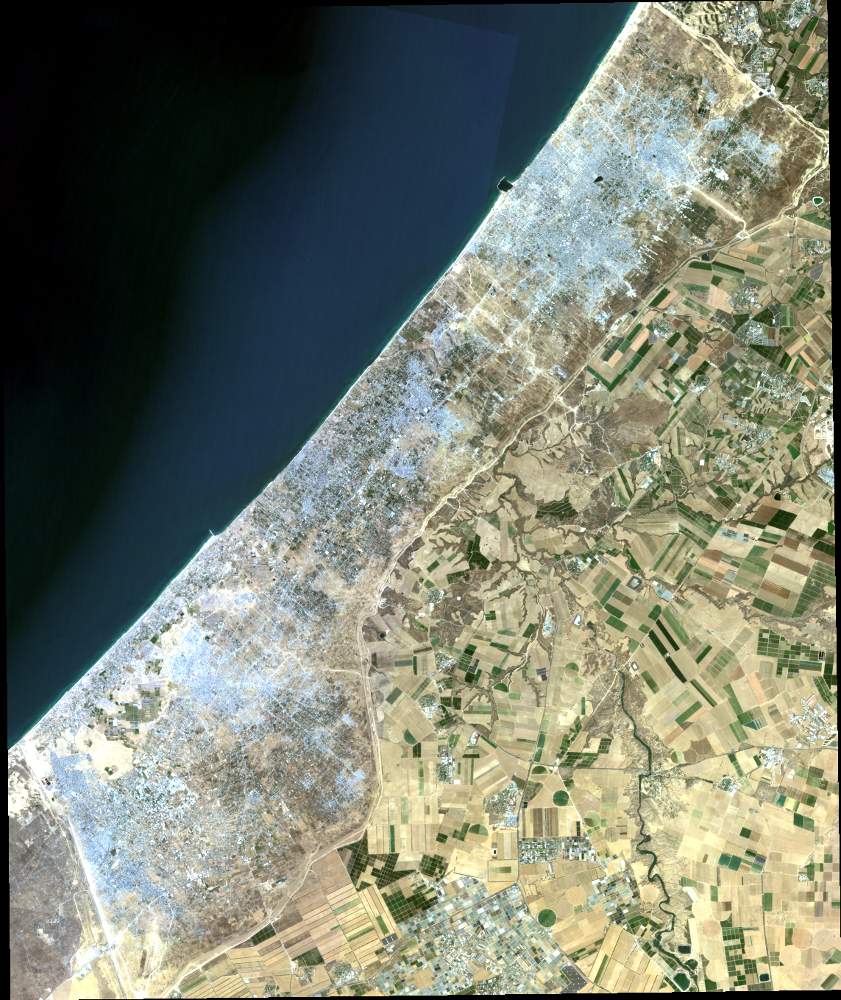

In [29]:
ps = raster_path('Gaza', '20240503', 'ps')
comparison_map_with_dates("Gaza", basemap="planet",
                          planet_raster=ps,
                          planet_png="/content/planet_post.png")

<h2>14. Extending the pipeline</h2>

Cheat sheet for the group.

<ul>
<li><b>New city or date</b>: export its rasters with the prototype GEE cells, then one
<code>add_city</code> call or registry entry. Nothing else changes.</li>
<li><b>New data source</b>: append channel names to <code>FULL_CHANNELS</code>, teach
<code>extract_city</code> to read the raster, add a switch in CONFIG features and a rule
in <code>active_channel_indices</code>.</li>
<li><b>New model</b>: a class with <code>forward(x, tab)</code> plus
<code>@register_model("name")</code>, then set CONFIG model to that name.</li>
<li><b>Pretrained backbone</b> (required by the project brief): register a model that
wraps torchvision ResNet18, average the RGB stem weights into our channel count, and
compare against small_cnn under this identical protocol.</li>
<li><b>Segmentation</b>: rasterize UNOSAT polygons into masks, add a
SegmentationDataset, remove the guard in Section 8, unet is ready.</li>
<li><b>Temporal smoothing</b>: add a second assessment date to a city registry entry
and feed both frames through <code>expand_labels_over_time</code>.</li>
<li><b>Experiment comparison</b>: every run writes config, metrics, figures and
predictions under <code>experiments/{name}</code>, diff two runs by diffing folders.</li>
</ul>